In [ ]:
import pandas as pd
import seaborn as sbn
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import numpy as np

In [ ]:
df_train=pd.read_csv("train.csv")

<ipython-input-2-281cfdd6d734>:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train=pd.read_csv("train.csv")


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [ ]:
df_train.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,98035.000000,100000.000000,100000.000000
mean,4194.170850,17.091280,22.47443,72.466040,21.068780,27.754251,32.285173,1403.118217
std,3183.686167,117.404834,129.05741,466.422621,14.860104,193.177339,5.116875,8306.041270
min,303.645417,-1.000000,0.00000,1.000000,-5.000000,0.000000,20.000000,0.000000
25%,1625.568229,3.000000,4.00000,8.000000,10.000000,3.000000,28.052567,30.306660
50%,3093.745000,6.000000,5.00000,13.000000,18.000000,6.000000,32.305784,69.249473
75%,5957.448333,7.000000,7.00000,20.000000,28.000000,9.000000,36.496663,161.224249
max,15204.633333,1798.000000,1499.00000,5797.000000,67.000000,2597.000000,50.000000,82331.000000


## Exprotory data analysis

## Discovering our categorical data.

In [ ]:
def categorical_data_count(categArr):
  for cols in categArr:
    print("#######columns:",cols,"####################")
    print( df_train[cols].value_counts())
def categorical_data_unique(categArr):
   for cols in categArr:
    print("#######columns:",cols,"####################")
    print( df_train[cols].unique())


In [ ]:
def plotcategoricalData(x):
    for col in x :
      fig = px.histogram(df_train,
                 x=col,
                  color='Credit_Score')
      fig.show()

In [ ]:
categArr=df_train.select_dtypes(include="object").columns.to_list()
columns_to_remove_atAll = ["ID", "Customer_ID", "Name", "SSN","Month","Type_of_Loan","Credit_History_Age"]
columns_to_remove_transform=["Age" ,"Annual_Income" , "Num_of_Loan" ,"Num_of_Delayed_Payment" ,"Changed_Credit_Limit" ,"Outstanding_Debt" ,"Amount_invested_monthly" , "Monthly_Balance" ]
columns_to_remove=columns_to_remove_atAll+columns_to_remove_transform
categArr = [col for col in categArr if col not in columns_to_remove]


* Here we train to see the relationship between target columns and our categorical data

In [ ]:
plotcategoricalData(categArr )

Output hidden; open in https://colab.research.google.com to view.

1. After plotting the relationships between these categorical columns and target columns, we conclude that the credit_mix column has a correlation with the target one. When we have a good credit mix, there is a domination of good classes, and the same applies for standard and poor. Therefore, credit_mix can be a valuable input feature for our model.

2. Credit history age may provide us with information about a good credit score because as the years of credit history increase, the likelihood of having a good score also increases.

3. For other features, they do not provide clear information about their relationship to the credit score category.



## Dealing with missing values and first data transformation

In [ ]:
categorical_data_unique(columns_to_remove_transform)

#######columns: Age ####################
['23' '-500' '28_' ... '4808_' '2263' '1342']
#######columns: Annual_Income ####################
['19114.12' '34847.84' '34847.84_' ... '20002.88' '39628.99' '39628.99_']
#######columns: Num_of_Loan ####################
['4' '1' '3' '967' '-100' '0' '0_' '2' '3_' '2_' '7' '5' '5_' '6' '8' '8_'
 '9' '9_' '4_' '7_' '1_' '1464' '6_' '622' '352' '472' '1017' '945' '146'
 '563' '341' '444' '720' '1485' '49' '737' '1106' '466' '728' '313' '843'
 '597_' '617' '119' '663' '640' '92_' '1019' '501' '1302' '39' '716' '848'
 '931' '1214' '186' '424' '1001' '1110' '1152' '457' '1433' '1187' '52'
 '1480' '1047' '1035' '1347_' '33' '193' '699' '329' '1451' '484' '132'
 '649' '995' '545' '684' '1135' '1094' '1204' '654' '58' '348' '614'
 '1363' '323' '1406' '1348' '430' '153' '1461' '905' '1312' '1424' '1154'
 '95' '1353' '1228' '819' '1006' '795' '359' '1209' '590' '696' '1185_'
 '1465' '911' '1181' '70' '816' '1369' '143' '1416' '455' '55' '1096'
 '1474' '420

### Removing unecessairry columns



In [ ]:
df_train=df_train.drop(columns=columns_to_remove_atAll)

#### Handling wrong typecasting

In [ ]:
df_train[ columns_to_remove_transform].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Age                      100000 non-null  float64
 1   Annual_Income            100000 non-null  float64
 2   Num_of_Loan              100000 non-null  float64
 3   Num_of_Delayed_Payment   100000 non-null  float64
 4   Changed_Credit_Limit     100000 non-null  float64
 5   Outstanding_Debt         100000 non-null  float64
 6   Amount_invested_monthly  100000 non-null  float64
 7   Monthly_Balance          100000 non-null  float64
dtypes: float64(8)
memory usage: 6.1 MB


In [ ]:
for col in  columns_to_remove_transform :
  df_train[col]=pd.to_numeric(df_train[col], errors='coerce')
df_train[ columns_to_remove_transform].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Age                      100000 non-null  float64
 1   Annual_Income            100000 non-null  float64
 2   Num_of_Loan              100000 non-null  float64
 3   Num_of_Delayed_Payment   100000 non-null  float64
 4   Changed_Credit_Limit     100000 non-null  float64
 5   Outstanding_Debt         100000 non-null  float64
 6   Amount_invested_monthly  100000 non-null  float64
 7   Monthly_Balance          100000 non-null  float64
dtypes: float64(8)
memory usage: 6.1 MB


In [ ]:
def plotnumiricalData(x):
    for col in x :
      fig = px.histogram(df_train,
                 x=col,
                 color='Credit_Score',
                  marginal='box',
                 nbins=47, )
      fig.show()

In [ ]:
numiraclcols=df_train.select_dtypes(include="number").columns.to_list()
plotnumiricalData(numiraclcols)

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Age                       100000 non-null  float64
 1   Occupation                100000 non-null  object 
 2   Annual_Income             100000 non-null  float64
 3   Monthly_Inhand_Salary     100000 non-null  float64
 4   Num_Bank_Accounts         100000 non-null  float64
 5   Num_Credit_Card           100000 non-null  float64
 6   Interest_Rate             100000 non-null  float64
 7   Num_of_Loan               100000 non-null  float64
 8   Delay_from_due_date       100000 non-null  float64
 9   Num_of_Delayed_Payment    100000 non-null  float64
 10  Changed_Credit_Limit      100000 non-null  float64
 11  Num_Credit_Inquiries      100000 non-null  float64
 12  Credit_Mix                100000 non-null  float64
 13  Outstanding_Debt          100000 non-null  fl

## Dealing with missing Values

In [ ]:
df_train.dropna(subset=['Credit_Score'], inplace=True)

In [ ]:
df_train.Credit_Score.isna().sum()

0

### Missing values in numirical features

In [ ]:
numeric_cols = df_train.select_dtypes(include=np.number).columns.tolist()
numeric_cols

['Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit',
 'Num_Credit_Inquiries',
 'Credit_Mix',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Total_EMI_per_month',
 'Amount_invested_monthly',
 'Monthly_Balance']

In [ ]:
df_train[numeric_cols].isna().sum()

Age                          4939
Annual_Income                6980
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  4785
Delay_from_due_date             0
Num_of_Delayed_Payment       9746
Changed_Credit_Limit         2091
Num_Credit_Inquiries         1965
Outstanding_Debt             1009
Credit_Utilization_Ratio        0
Total_EMI_per_month             0
Amount_invested_monthly      8784
Monthly_Balance              1209
dtype: int64

In [ ]:
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(strategy = 'mean')
imputer.fit(df_train[numeric_cols])
list(imputer.statistics_)

[110.93450521244253,
 178578.96419941948,
 4194.170849600523,
 17.09128,
 22.47443,
 72.46604,
 2.780339232263824,
 21.06878,
 31.033051166707292,
 10.389025115157953,
 27.75425103279441,
 1426.5037001343558,
 32.2851725189436,
 1403.1182166159933,
 195.5394560265526,
 402.5512581105154]

In [ ]:
df_train[numeric_cols]=imputer.transform(df_train[numeric_cols])

In [ ]:
df_train[numeric_cols].isna().sum()

Age                         0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Total_EMI_per_month         0
Amount_invested_monthly     0
Monthly_Balance             0
dtype: int64

### Missing values in categorical features

In [ ]:
categorical_cols = df_train.select_dtypes('object').columns.tolist()

In [ ]:
df_train[categorical_cols].isna().sum()

Occupation               0
Payment_of_Min_Amount    0
Payment_Behaviour        0
Credit_Score             0
dtype: int64

* we see that we don't have clear missing value form in categorical variables but we can discover the missing value related to each categorical variable based on the data .

In [ ]:
df_train['Occupation'].replace("_______", np.nan, inplace=True)

In [ ]:
df_train['Credit_Mix'].replace("_", np.nan, inplace=True)

In [ ]:
df_train['Payment_of_Min_Amount'].replace("NM", np.nan, inplace=True)

In [ ]:
df_train['Payment_Behaviour'].replace("!@9#%8", np.nan, inplace=True)

In [ ]:
imputer = SimpleImputer(strategy='most_frequent')
imputer.fit(df_train[categorical_cols])
list(imputer.statistics_)

['Lawyer', 'Yes', 'Low_spent_Small_value_payments', 'Standard']

In [ ]:
df_train[categorical_cols]=imputer.transform(df_train[categorical_cols])
df_train[categorical_cols].isna().sum()

Occupation               0
Payment_of_Min_Amount    0
Payment_Behaviour        0
Credit_Score             0
dtype: int64

## Standarization for numirical features

In [ ]:
df_train.isna().sum()

Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [ ]:
df_train.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,0.066420,0.007092,0.261092,0.010056,0.014993,0.012330,0.064399,0.362066,0.007735,0.388381,0.010687,1.053480,0.285378,0.409506,0.017042,0.098891,0.251270
std,0.073078,0.057526,0.196979,0.065261,0.086096,0.080473,0.038213,0.206390,0.049003,0.154582,0.073650,0.656052,0.229940,0.170563,0.100886,0.096392,0.132724
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.057078,0.000540,0.099889,0.002223,0.002668,0.001208,0.063910,0.208333,0.002727,0.274045,0.001155,1.000000,0.114333,0.268419,0.000368,0.038950,0.169101
50%,0.058056,0.001404,0.238178,0.003891,0.003336,0.002070,0.064536,0.319444,0.004091,0.369305,0.002310,1.000000,0.235232,0.410193,0.000841,0.072385,0.211397
75%,0.059143,0.003163,0.340104,0.004447,0.004670,0.003278,0.065789,0.458333,0.005227,0.486654,0.003466,1.000000,0.386807,0.549889,0.001958,0.111281,0.291918
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(df_train[numeric_cols])
list(scaler.data_min_)
list(scaler.data_max_)
df_train[numeric_cols] = scaler.transform(df_train[numeric_cols])
df_train[numeric_cols].describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,0.066420,0.007092,0.261092,0.010056,0.014993,0.012330,0.064399,0.362066,0.007735,0.388381,0.010687,0.526740,0.285378,0.409506,0.017042,0.098891,0.251270
std,0.073078,0.057526,0.196979,0.065261,0.086096,0.080473,0.038213,0.206390,0.049003,0.154582,0.073650,0.328026,0.229940,0.170563,0.100886,0.096392,0.132724
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.057078,0.000540,0.099889,0.002223,0.002668,0.001208,0.063910,0.208333,0.002727,0.274045,0.001155,0.500000,0.114333,0.268419,0.000368,0.038950,0.169101
50%,0.058056,0.001404,0.238178,0.003891,0.003336,0.002070,0.064536,0.319444,0.004091,0.369305,0.002310,0.500000,0.235232,0.410193,0.000841,0.072385,0.211397
75%,0.059143,0.003163,0.340104,0.004447,0.004670,0.003278,0.065789,0.458333,0.005227,0.486654,0.003466,0.500000,0.386807,0.549889,0.001958,0.111281,0.291918
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Encoding Categorical features

In [ ]:
print(df_train.Credit_Mix.unique())

['Standard' 'Good' 'Bad']


In [ ]:
from sklearn.preprocessing import OrdinalEncoder
month_to_num = {'Bad': 0, 'Standard': 1, 'Good': 2}
df_train['Credit_Mix'] = df_train['Credit_Mix'].map(month_to_num)
encoder = OrdinalEncoder()
df_train['Credit_Mix'] = encoder.fit_transform(df_train[['Credit_Mix']])


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Age                       100000 non-null  float64
 1   Occupation                100000 non-null  object 
 2   Annual_Income             100000 non-null  float64
 3   Monthly_Inhand_Salary     100000 non-null  float64
 4   Num_Bank_Accounts         100000 non-null  float64
 5   Num_Credit_Card           100000 non-null  float64
 6   Interest_Rate             100000 non-null  float64
 7   Num_of_Loan               100000 non-null  float64
 8   Delay_from_due_date       100000 non-null  float64
 9   Num_of_Delayed_Payment    100000 non-null  float64
 10  Changed_Credit_Limit      100000 non-null  float64
 11  Num_Credit_Inquiries      100000 non-null  float64
 12  Credit_Mix                100000 non-null  float64
 13  Outstanding_Debt          100000 non-null  fl

In [ ]:
categorical_cols = df_train.select_dtypes('object').columns.tolist()
categorical_cols

['Occupation', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score']

In [ ]:
categorical_cols.remove('Credit_Score')
categorical_cols

['Occupation', 'Payment_of_Min_Amount', 'Payment_Behaviour']

In [ ]:
df_train.Occupation.unique()

array(['Scientist', 'Lawyer', 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Media_Manager', 'Doctor', 'Journalist', 'Manager',
       'Accountant', 'Musician', 'Mechanic', 'Writer', 'Architect'],
      dtype=object)

In [ ]:
df_train.Payment_of_Min_Amount.unique()

array(['No', 'Yes'], dtype=object)

In [ ]:
df_train.Payment_Behaviour.unique()

array(['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments',
       'High_spent_Large_value_payments'], dtype=object)

In [ ]:
from sklearn.preprocessing import OneHotEncoder
encoder=OneHotEncoder(sparse=False, handle_unknown='ignore')
encoder.fit(df_train[categorical_cols])
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



In [ ]:
print(encoded_cols)

['Occupation_Accountant', 'Occupation_Architect', 'Occupation_Developer', 'Occupation_Doctor', 'Occupation_Engineer', 'Occupation_Entrepreneur', 'Occupation_Journalist', 'Occupation_Lawyer', 'Occupation_Manager', 'Occupation_Mechanic', 'Occupation_Media_Manager', 'Occupation_Musician', 'Occupation_Scientist', 'Occupation_Teacher', 'Occupation_Writer', 'Payment_of_Min_Amount_No', 'Payment_of_Min_Amount_Yes', 'Payment_Behaviour_High_spent_Large_value_payments', 'Payment_Behaviour_High_spent_Medium_value_payments', 'Payment_Behaviour_High_spent_Small_value_payments', 'Payment_Behaviour_Low_spent_Large_value_payments', 'Payment_Behaviour_Low_spent_Medium_value_payments', 'Payment_Behaviour_Low_spent_Small_value_payments']


In [ ]:
len(encoded_cols)

23

In [ ]:
df_train[encoded_cols] = encoder.transform(df_train[categorical_cols])

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Age                                                 100000 non-null  float64
 1   Occupation                                          100000 non-null  object 
 2   Annual_Income                                       100000 non-null  float64
 3   Monthly_Inhand_Salary                               100000 non-null  float64
 4   Num_Bank_Accounts                                   100000 non-null  float64
 5   Num_Credit_Card                                     100000 non-null  float64
 6   Interest_Rate                                       100000 non-null  float64
 7   Num_of_Loan                                         100000 non-null  float64
 8   Delay_from_due_date                                 100000 non-nu

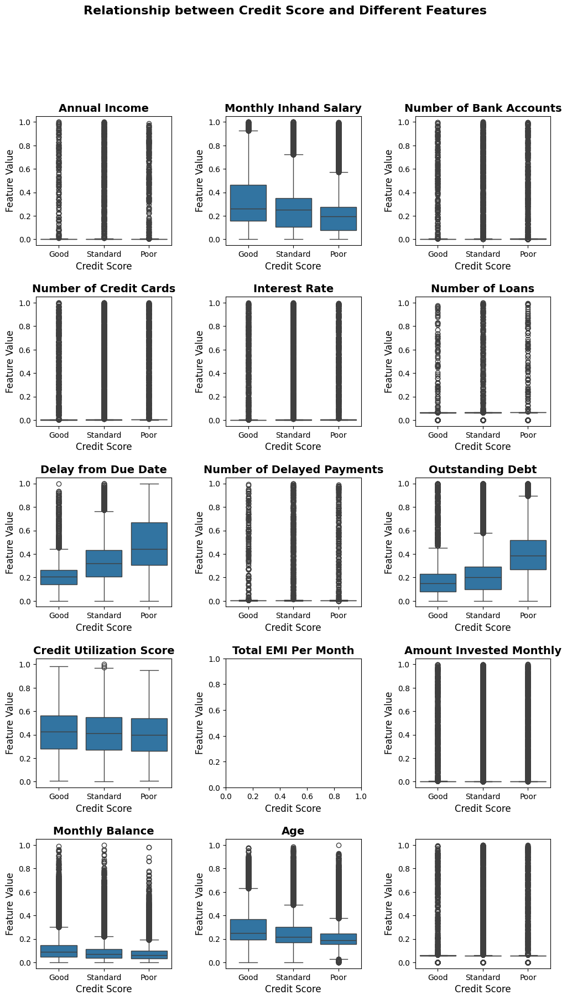

In [ ]:
# Create a figure and 2x3 grid of subplots
fig, ax = plt.subplots(5, 3, figsize=(12, 20))

# Flatten the 2D array of subplots into a 1D array
ax = ax.flatten()

# Plot multiple box plots on the same axis
sns.boxplot(x='Credit_Score', y='Annual_Income', data=df_train, ax=ax[0])
sns.boxplot(x='Credit_Score', y='Monthly_Inhand_Salary', data=df_train, ax=ax[1])
sns.boxplot(x='Credit_Score', y='Num_Bank_Accounts', data=df_train, ax=ax[2])
sns.boxplot(x='Credit_Score', y='Num_Credit_Card', data=df_train, ax=ax[3])
sns.boxplot(x='Credit_Score', y='Interest_Rate', data=df_train, ax=ax[4])
sns.boxplot(x='Credit_Score', y='Num_of_Loan', data=df_train, ax=ax[5])
sns.boxplot(x='Credit_Score', y='Delay_from_due_date', data=df_train, ax=ax[6])
sns.boxplot(x='Credit_Score', y='Num_of_Delayed_Payment', data=df_train, ax=ax[7])
sns.boxplot(x='Credit_Score', y='Outstanding_Debt', data=df_train, ax=ax[8])
sns.boxplot(x='Credit_Score', y='Credit_Utilization_Ratio', data=df_train, ax=ax[9])
sns.boxplot(x='Credit_Score', y='Total_EMI_per_month', data=df_train, ax=ax[11])
sns.boxplot(x='Credit_Score', y='Amount_invested_monthly', data=df_train, ax=ax[12])
sns.boxplot(x='Credit_Score', y='Monthly_Balance', data=df_train, ax=ax[13])
sns.boxplot(x='Credit_Score', y='Age', data=df_train, ax=ax[14])

# Add a title and labels
#plt.title('Relationship between Credit Score and Different Features')
plt.xlabel('Credit Score')
plt.ylabel('Feature Value')

# Adjust the spacing between subplots
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Add a white grid
for i in range(15):
    ax[i].grid(color='white', linestyle='-', linewidth=2, alpha=0.5)
fig.suptitle('Relationship between Credit Score and Different Features', fontsize=16, fontweight='bold')

# Set the font size for all subplot titles
titles = ['Annual Income', 'Monthly Inhand Salary', 'Number of Bank Accounts', 'Number of Credit Cards',
          'Interest Rate', 'Number of Loans', 'Delay from Due Date', 'Number of Delayed Payments',
          'Outstanding Debt', 'Credit Utilization Score', 'Total EMI Per Month',
          'Amount Invested Monthly', 'Monthly Balance', 'Age']
for i in range(14):
    ax[i].set_title(titles[i], fontsize=14, fontweight='bold')

    # Set the font size for all x and y labels
for i in range(15):
    ax[i].set_xlabel('Credit Score', fontsize=12)
    ax[i].set_ylabel('Feature Value', fontsize=12)

# Show the plot
plt.show()

## Split the data

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_df,val_df=train_test_split(df_train,test_size=0.2,random_state=42)
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
input_cols= train_df.drop(columns=["Credit_Score"]).columns.tolist()
target_col="Credit_Score"
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()


train_df.shape : (80000, 44)
val_df.shape : (20000, 44)


## Saving the procces it Data

## Function for develope the models

In [106]:
!pip install pyarrow --quiet
# inputs
train_inputs.to_parquet('train_inputs.parquet')
val_inputs.to_parquet('val_inputs.parquet')
# targets
pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(val_targets).to_parquet('val_targets.parquet')

In [107]:
train_inputs = pd.read_parquet('train_inputs.parquet')
val_inputs = pd.read_parquet('val_inputs.parquet')

train_targets = pd.read_parquet('train_targets.parquet')[target_col]
val_targets = pd.read_parquet('val_targets.parquet')[target_col]


## Models testing

In [108]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from  sklearn.ensemble import GradientBoostingClassifier ,RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import joblib

In [109]:
import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import joblib

import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import joblib

def trainModel(Model):
    # Select only numeric columns
    numeric_cols = ["Annual_Income", "Monthly_Inhand_Salary", "Num_Bank_Accounts", "Num_Credit_Card", "Interest_Rate", "Num_of_Loan",
        "Delay_from_due_date", "Num_of_Delayed_Payment", "Credit_Mix", "Outstanding_Debt", "Monthly_Balance"]
    X_train = train_inputs[numeric_cols]
    X_val = val_inputs[numeric_cols]
    y_train = train_targets.values.ravel()
    y_val = val_targets.values.ravel()

    # Initialize and fit the model
    model = Model
    model.fit(X_train, y_train)

    # Evaluate on the validation set
    y_pred_val = model.predict(X_val)

    # Print classification report and confusion matrix
    print('Classification Report:\n', classification_report(y_val, y_pred_val))
    print('Confusion Matrix:\n', confusion_matrix(y_val, y_pred_val))
    print('Accuracy Score:\n', accuracy_score(y_val, y_pred_val))

    # Save the model
    joblib.dump(model, 'best_model.joblib')
    print("Model saved as 'best_model.joblib'")



In [ ]:
model = RandomForestClassifier(
    n_estimators=300,
    criterion='entropy',
    max_depth=10,
    class_weight='balanced',
    min_samples_split=40,
    min_samples_leaf=15,
    random_state=42,
    ccp_alpha=0.001
)
trainModel(model)

Training set accuracy: 67.49%
Validation set accuracy: 67.14%
Classification Report:
               precision    recall  f1-score   support

        Good       0.52      0.78      0.62      3527
        Poor       0.63      0.78      0.70      5874
    Standard       0.83      0.57      0.68     10599

    accuracy                           0.67     20000
   macro avg       0.66      0.71      0.67     20000
weighted avg       0.71      0.67      0.67     20000

Confusion Matrix:
 [[2767  121  639]
 [ 659 4609  606]
 [1942 2605 6052]]
Accuracy Score:
 0.6714


In [ ]:
model = DecisionTreeClassifier(
    criterion='gini',
    splitter='best',
    max_depth=15,
    min_samples_split=10,
    min_samples_leaf=5,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    class_weight=None,
    ccp_alpha=0.0
)
trainModel(model)


Training set accuracy: 78.19%
Validation set accuracy: 71.39%
Classification Report:
               precision    recall  f1-score   support

        Good       0.61      0.59      0.60      3527
        Poor       0.73      0.70      0.71      5874
    Standard       0.74      0.76      0.75     10599

    accuracy                           0.71     20000
   macro avg       0.69      0.68      0.69     20000
weighted avg       0.71      0.71      0.71     20000

Confusion Matrix:
 [[2097  118 1312]
 [ 278 4085 1511]
 [1074 1428 8097]]
Accuracy Score:
 0.71395


In [119]:

model = LogisticRegression(
    penalty='l2',
    dual=False,
    tol=0.0001,
    C=1.0,
    fit_intercept=True,
    intercept_scaling=1,
    class_weight=None,
    random_state=None,
    solver='saga',
    max_iter=100,
    multi_class='multinomial',
    verbose=0,
    warm_start=False,
    n_jobs=None,
    l1_ratio=None
)

trainModel(model)

Classification Report:
               precision    recall  f1-score   support

        Good       0.52      0.54      0.53      3527
        Poor       0.59      0.37      0.45      5874
    Standard       0.62      0.74      0.67     10599

    accuracy                           0.59     20000
   macro avg       0.57      0.55      0.55     20000
weighted avg       0.59      0.59      0.58     20000

Confusion Matrix:
 [[1890   58 1579]
 [ 418 2155 3301]
 [1340 1460 7799]]
Accuracy Score:
 0.5922
Model saved as 'best_model.joblib'


In [ ]:
model = KNeighborsClassifier(
    n_neighbors=10,
    weights='uniform',
    algorithm='auto',
    leaf_size=30,
    p=2,
    metric='minkowski',
    n_jobs=None
)
metric = accuracy_score
trainModel(model)


Training set accuracy: 71.24%
Validation set accuracy: 65.29%
Classification Report:
               precision    recall  f1-score   support

        Good       0.52      0.51      0.52      3527
        Poor       0.64      0.66      0.65      5874
    Standard       0.70      0.70      0.70     10599

    accuracy                           0.65     20000
   macro avg       0.62      0.62      0.62     20000
weighted avg       0.65      0.65      0.65     20000

Confusion Matrix:
 [[1795  160 1572]
 [ 425 3874 1575]
 [1212 1998 7389]]
Accuracy Score:
 0.6529


In [110]:
model = GradientBoostingClassifier(
    loss='log_loss',
    learning_rate=0.1,
    n_estimators=300,
    subsample=0.8,
    criterion='friedman_mse',
    min_samples_split=100,
    min_samples_leaf=60,
    min_weight_fraction_leaf=0.0,
    max_depth=3,
    min_impurity_decrease=0.0,
    init=None,
    random_state=42,
    max_features=None,
    verbose=0,
    max_leaf_nodes=None,
    warm_start=False,
    validation_fraction=0.1,
    n_iter_no_change=None,
    tol=0.0001,
    ccp_alpha=0.0
)

trainModel(model)


Classification Report:
               precision    recall  f1-score   support

        Good       0.60      0.64      0.62      3527
        Poor       0.71      0.68      0.70      5874
    Standard       0.74      0.74      0.74     10599

    accuracy                           0.71     20000
   macro avg       0.68      0.69      0.69     20000
weighted avg       0.71      0.71      0.71     20000

Confusion Matrix:
 [[2250   69 1208]
 [ 328 4017 1529]
 [1178 1548 7873]]
Accuracy Score:
 0.707
Model saved as 'best_model.joblib'


In [121]:
import pandas as pd
import joblib

def load_model(model_path):
    model = joblib.load(model_path)
    return model

def predict_single_input(input_data, model):
    numeric_cols = ["Annual_Income", "Monthly_Inhand_Salary", "Num_Bank_Accounts", "Num_Credit_Card", "Interest_Rate", "Num_of_Loan",
        "Delay_from_due_date", "Num_of_Delayed_Payment", "Credit_Mix", "Outstanding_Debt", "Monthly_Balance"]
    input_df = pd.DataFrame([input_data], columns=numeric_cols)  # Wrap input_data in a list
    prediction = model.predict(input_df)
    return prediction[0]  # Return the first prediction

model_path = 'best_model.joblib'
loaded_model = load_model(model_path)

single_input = {
    "Annual_Income": 19114,
    "Monthly_Inhand_Salary": 1824,
    "Num_Bank_Accounts": 3,
    "Num_Credit_Card": 4,
    "Interest_Rate": 3,
    "Num_of_Loan": 4,
    "Delay_from_due_date": 3,
    "Num_of_Delayed_Payment": 6,
    "Credit_Mix": 2,
    "Outstanding_Debt": 809,
    "Monthly_Balance": 1866
}

prediction = predict_single_input(single_input, loaded_model)  # Pass single_input directly
print("Predicted class:", prediction)


Predicted class: Standard
